In [1]:
from pauli_funct import *

Some example code, just as a demo

In [2]:
rho0= pa.PauliArray.from_labels('IIIIIIIIZIIIIIII')
print(rho0.inspect())
print()
# Here, the PauliArray type obect is created from a string of "labelled" Pauli matrices, including the 2x2 identity, so IXYZ. 
# from_labels is the PauliArray method that performs this

rho0 = op.Operator.from_paulis_and_weights(rho0, 1)
print(rho0.inspect())
print()
# Here, the Operator type object is created by taking in weighted PauliArray(s)
# from_paulis_and_weights is the PauliArray method that performs this

PauliArray
IIIIIIIIZIIIIIII

Operator
Sum of
(+1.0000 +0.0000j) IIIIIIIIZIIIIIII



In [3]:
seed_str = 'X'
pad_width = 2

padded_seed = 'I'*pad_width + seed_str + 'I'*pad_width
n = len(padded_seed)        # total number of qubits

o0 = pa.PauliArray.from_labels(padded_seed)         # in this case, 5 I's, X, 5 I's or IIIIIXIIIII

print(o0.inspect())
print()

o0_op = op.Operator.from_paulis_and_weights(o0, 1)

print(o0_op.inspect())
print()

PauliArray
IIXII

Operator
Sum of
(+1.0000 +0.0000j) IIXII



In [4]:
edges = [(k,(k+1)% n) for k in range(n)]        
print(edges)
print()
# So for example, if n==11 (no of qubits), then edges would be a list of tuples from [(0,1), (1,2), ... (10,0)] since the last element is up to but not including.
# In each tuple, the number inside is the qubit that that operator will act on. For example, (0,1) means that Qubit0 and Qubit1 will have "True" for the Z or X string.

[(0, 1), (1, 2), (2, 3), (3, 4), (4, 0)]



In [5]:
# Initialise a 2D array (a "matrix") of 0s for all these, Bool type where 0 == False
ising_z = np.zeros((len(edges), n), dtype=bool)                     
# print(ising_z)
# print()
ising_x = np.zeros((len(edges), n), dtype=bool)
ff1_z = np.zeros((len(edges), n), dtype=bool)
ff1_x = np.zeros((len(edges), n), dtype=bool)
ff2_z = np.zeros((len(edges), n), dtype=bool)
ff2_x = np.zeros((len(edges), n), dtype=bool)

for idx, edge in enumerate(edges):
    # print([idx, edge])
    # print()                  
    ising_z[idx, edge] = True                   # for the 2D array, the first element indicates the row(s) to act, and the second element the column(s) to act on. In this case, one row (from idx) and two columns (from edge, which is a 2-element tuple)
    ff1_x[idx, edge] = True
    ff2_z[idx, edge] = True
    ff2_x[idx, edge] = True

print(ising_z)
print()

ising_hamiltonian = op.Operator.from_paulis_and_weights(pa.PauliArray(ising_z, ising_x), 1)         
ff1_hamiltonian = op.Operator.from_paulis_and_weights(pa.PauliArray(ff1_z, ff1_x), -0.5)
ff2_hamiltonian = op.Operator.from_paulis_and_weights(pa.PauliArray(ff2_z, ff2_x), -0.5)

print(ising_hamiltonian.inspect())      # It's just Sum of ZiZi+1 over all i in a ring of qubits
print()
print(ff1_hamiltonian.inspect())        # first part of flip flop hamiltonian as seen in spin chains exercise
print()
print(ff2_hamiltonian.inspect())        # second part of flip flop hamiltonian as seen in spin chains exercise
print("=========================")

# ========================================================
# # This hamiltonian is exactly the same as seen in the operator evolution and XXZ hamiltonian exercise

# The following three statements are equivalent (use truth test with print statements to verify this)
# ham1 = ising_hamiltonian+ff1_hamiltonian+ff2_hamiltonian     
# ham2 = (ising_hamiltonian.add_operator(ff1_hamiltonian)).add_operator(ff2_hamiltonian)
ham = ising_hamiltonian.__add__(ff1_hamiltonian).__add__(ff2_hamiltonian)
# print(ham1 == ham2)
# print(ham2 == ham3)
# print("=========================")

print(ham.inspect())

[[ True  True False False False]
 [False  True  True False False]
 [False False  True  True False]
 [False False False  True  True]
 [ True False False False  True]]

Operator
Sum of
(+1.0000 +0.0000j) IIIZZ
(+1.0000 +0.0000j) IIZZI
(+1.0000 +0.0000j) IZZII
(+1.0000 +0.0000j) ZZIII
(+1.0000 +0.0000j) ZIIIZ

Operator
Sum of
(-0.5000 +0.0000j) IIIXX
(-0.5000 +0.0000j) IIXXI
(-0.5000 +0.0000j) IXXII
(-0.5000 +0.0000j) XXIII
(-0.5000 +0.0000j) XIIIX

Operator
Sum of
(-0.5000 +0.0000j) IIIYY
(-0.5000 +0.0000j) IIYYI
(-0.5000 +0.0000j) IYYII
(-0.5000 +0.0000j) YYIII
(-0.5000 +0.0000j) YIIIY
Operator
Sum of
(-0.5000 +0.0000j) XXIII
(-0.5000 +0.0000j) IXXII
(-0.5000 +0.0000j) IIXXI
(-0.5000 +0.0000j) XIIIX
(-0.5000 +0.0000j) IIIXX
(+1.0000 +0.0000j) ZZIII
(-0.5000 +0.0000j) YYIII
(+1.0000 +0.0000j) IZZII
(-0.5000 +0.0000j) IYYII
(+1.0000 +0.0000j) IIZZI
(-0.5000 +0.0000j) IIYYI
(+1.0000 +0.0000j) ZIIIZ
(-0.5000 +0.0000j) YIIIY
(+1.0000 +0.0000j) IIIZZ
(-0.5000 +0.0000j) IIIYY


In [6]:
edge1 = [(2,3)]
edge2 = [(3,4)]

ham1 = generate_dipole_hamiltonian(len(padded_seed), neighbor_list=edge1)
ham2 = generate_dipole_hamiltonian(len(padded_seed), neighbor_list=edge2)

print(ham1.inspect())
print()
print(ham2.inspect())
print()
# Remember the printouts are based on little-endian counting

Operator
Sum of
(-0.5000 +0.0000j) IXXII
(+1.0000 +0.0000j) IZZII
(-0.5000 +0.0000j) IYYII

Operator
Sum of
(-0.5000 +0.0000j) XXIII
(+1.0000 +0.0000j) ZZIII
(-0.5000 +0.0000j) YYIII



In [7]:
print(op.commutator(ham1, ham2).inspect())
print()

Operator
Sum of
(+0.0000 +1.0000j) ZYXII
(+0.0000 +0.5000j) YZXII
(+0.0000 -1.0000j) XYZII
(+0.0000 +1.0000j) YXZII
(+0.0000 -0.5000j) XZYII
(+0.0000 -1.0000j) ZXYII



# Liouvillian graph
Christopher White's papers are the most detailed explanations of these, including the meaning of the vertices and edges etc inside the graph. \
Keep in mind that these graphs are DIFFERENT from the graphs described in the PauliArray documentation, as shown here: https://algolab-quantique.github.io/pauliarray/tutorials/commutators.html. The graphs in this documentation refer to qubit nodes with edge interactions.

When the initial (t=0) Pauli string evolves in time (Heisenberg picture, operators evolve) via the Liouville equation, what happens is that it will become some new Pauli string. This new Pauli string, can be decomposed into more Pauli strings using equation (14) of White's paper. 

So each time step, the Pauli string will go from one node to another with some weight (see equation (14)); if we were to sum up the weights and the destination Pauli strings, we would acquire the total new Pauli string. 

The trace of (sigma^mu * Comm(sigma^nu, Hamiltonian)) is known as the Hilbert Schmidt inner product. This inner product gives (something proportional to) the weight of the component of the evolution into each new Pauli string, as determined by the Liouvillian superoperator, as seen in equation (16) of White's paper.

In [8]:
### Test Liouville graph with a bunch of print functions
graph, label_map = generate_liouvillian_graph(padded_seed, ham, depth=2, max_nodes=1000)

Layer: 0

label: IIXII

o_next: Operator
Sum of
(+0.0000 +1.0000j) IYZII
(+0.0000 +2.0000j) IZYII
(+0.0000 +2.0000j) IIYZI
(+0.0000 +1.0000j) IIZYI

Layer: 1

label: IYZII

o_next: Operator
Sum of
(+0.0000 -2.0000j) IXIII
(+0.0000 -1.0000j) IIXII
(+0.0000 -2.0000j) ZXZII
(+0.0000 -1.0000j) XZZII
(+0.0000 +1.0000j) IYYXI
(+0.0000 -1.0000j) IYXYI

label: IZYII

o_next: Operator
Sum of
(+0.0000 -1.0000j) IXIII
(+0.0000 -2.0000j) IIXII
(+0.0000 -1.0000j) YXYII
(+0.0000 +1.0000j) XYYII
(+0.0000 -1.0000j) IZZXI
(+0.0000 -2.0000j) IZXZI

label: IIYZI

o_next: Operator
Sum of
(+0.0000 -2.0000j) IIXII
(+0.0000 -1.0000j) IIIXI
(+0.0000 -2.0000j) IZXZI
(+0.0000 -1.0000j) IXZZI
(+0.0000 +1.0000j) IIYYX
(+0.0000 -1.0000j) IIYXY

label: IIZYI

o_next: Operator
Sum of
(+0.0000 -1.0000j) IIXII
(+0.0000 -2.0000j) IIIXI
(+0.0000 -1.0000j) IYXYI
(+0.0000 +1.0000j) IXYYI
(+0.0000 -1.0000j) IIZZX
(+0.0000 -2.0000j) IIZXZ



Now time to visualise this as a graph!

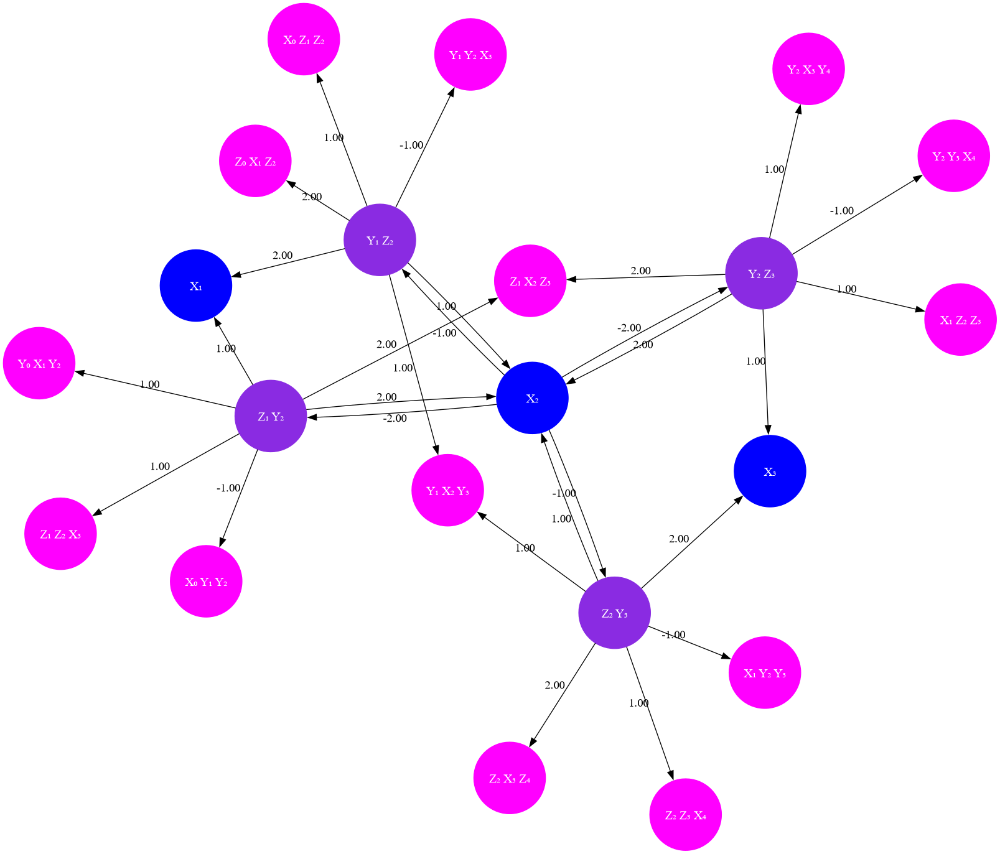

In [9]:
graphviz_draw(graph, node_attr_fn=node_attr, edge_attr_fn=edge_attr, method='sfdp')

Create an adjacency matrix for this graph.   
Note that @ is the matrix multiplication operator in Python!

In [10]:
chain_mat = rx.adjacency_matrix(graph, weight_fn= lambda x: x).T        # Create the Liouville graph's associated adjacency matrix; easy for rustworks to do

# Example usage with the notebook's variables:
n = chain_mat.shape[0]      # rows of the adjacency matrix
A0 = np.zeros(n)            # Just create 
A0[0] = 1.0                 # set initial occupancy on the root node (root_idx exists in the notebook)

times = np.linspace(0.0, 10.0, 100)  # adjust as needed

A_t = solve_chain_time_series(chain_mat, A0, times, max_step=0.001)

# print a small summary
print("A(t) shape:", A_t.shape)
print("A(0) :", A_t[0])     # confirms that A_t[0] == A0 as we wanted

A(t) shape: (100, 21)
A(0) : [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


# Double Quantum (DQ) Hamiltonian
Now we apply these techniques to observe the evolution and Multiple Quantum Coherences of the DQ Hamiltonian

In [11]:
seed_str = 'Z'
pad_width = 3
padded_seed = 'I'*pad_width + seed_str + 'I'*pad_width
ham = generate_dq_hamiltonian(len(padded_seed))
#ham = generate_xxz_hamiltonian(len(padded_seed),delta=-2)
root_idx = 0  # since seed is the first node added

Layer: 0

label: IIIZIII

o_next: Operator
Sum of
(+0.0000 -2.0000j) IIYXIII
(+0.0000 -2.0000j) IIXYIII
(+0.0000 -2.0000j) IIIYXII
(+0.0000 -2.0000j) IIIXYII

Layer: 1

label: IIYXIII

o_next: Operator
Sum of
(+0.0000 +2.0000j) IIZIIII
(+0.0000 +2.0000j) IXZXIII
(+0.0000 +2.0000j) IIIZIII
(+0.0000 +2.0000j) IIYZYII

label: IIXYIII

o_next: Operator
Sum of
(+0.0000 +2.0000j) IIZIIII
(+0.0000 +2.0000j) IIIZIII
(+0.0000 +2.0000j) IIXZXII
(+0.0000 +2.0000j) IYZYIII

label: IIIYXII

o_next: Operator
Sum of
(+0.0000 +2.0000j) IIIZIII
(+0.0000 +2.0000j) IIXZXII
(+0.0000 +2.0000j) IIIIZII
(+0.0000 +2.0000j) IIIYZYI

label: IIIXYII

o_next: Operator
Sum of
(+0.0000 +2.0000j) IIIZIII
(+0.0000 +2.0000j) IIIIZII
(+0.0000 +2.0000j) IIIXZXI
(+0.0000 +2.0000j) IIYZYII

Layer: 2

label: IIZIIII

o_next: Operator
Sum of
(+0.0000 -2.0000j) IYXIIII
(+0.0000 -2.0000j) IXYIIII
(+0.0000 -2.0000j) IIYXIII
(+0.0000 -2.0000j) IIXYIII

label: IXZXIII

o_next: Operator
Sum of
(+0.0000 -2.0000j) IXYIIII
(+0.0000 

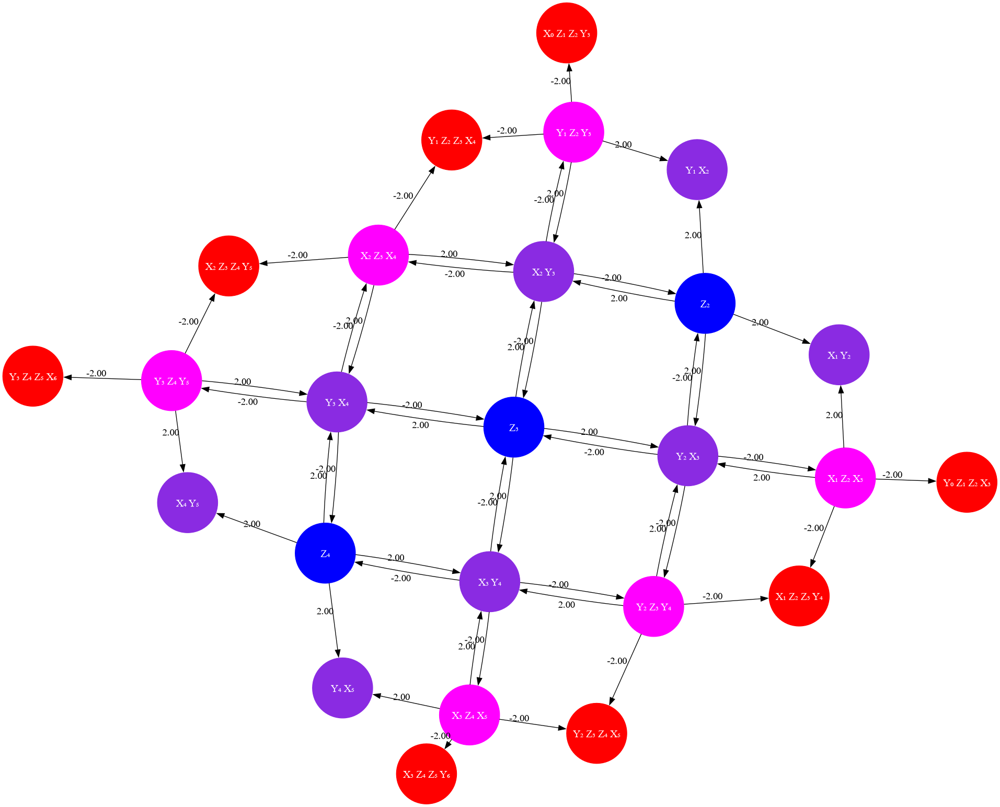

In [12]:
graph_2, label_map_2 = generate_liouvillian_graph(padded_seed, ham, depth=3, corr_cutoff=4, max_nodes=100000, directed=True)
graphviz_draw(graph_2, node_attr_fn=node_attr, edge_attr_fn=edge_attr, method='sfdp')

In [13]:
chain_mat_2 =  rx.adjacency_matrix(graph_2, weight_fn= lambda x: x).T

# Example usage with the notebook's variables:
n = chain_mat_2.shape[0]
A0 = np.zeros(n)
print(chain_mat_2)
A0[0] = 1.0     # set initial occupancy on the root node (root_idx exists in the notebook)

times = np.linspace(0.0, 5.0, 100)  # adjust as needed
A_t = solve_chain_time_series(chain_mat_2, A0, times, max_step=0.001)

# print a small summary
print("A(t) shape:", A_t.shape)
print("A(0) :", A_t[0])     # initial adjacency matrix at 0 time

[[ 0. -2. -2. -2. -2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.]
 [ 2.  0.  0.  0.  0.  2.  2.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.]
 [ 2.  0.  0.  0.  0.  2.  0.  0.  2.  2.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.]
 [ 2.  0.  0.  0.  0.  0.  0.  0.  2.  0.  2.  2.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.]
 [ 2.  0.  0.  0.  0.  0.  0.  2.  0.  0.  2.  0.  2.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.]
 [ 0. -2. -2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.]
 [ 0. -2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.]
 [ 0. -2.  0.  0. -2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0. -2. -2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0. -2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  

Plotting the amplitude of the single Z Pauli strings

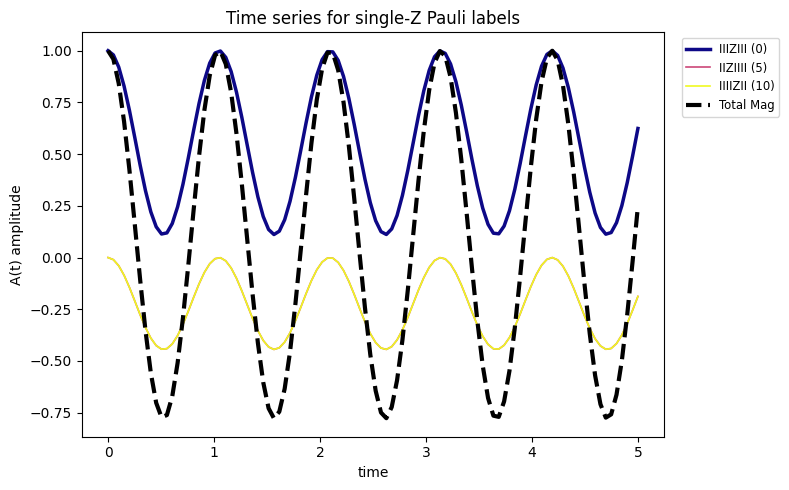

In [14]:
# Filter for labels with exactly one 'Z'
zi_items = [(lab, idx) for lab, idx in label_map_2.items() if set(lab) <= {"I", "Z"}]       # Only if the label contains I's and Z's
single_z_items = [(lab, idx) for lab, idx in zi_items if lab.count('Z') == 1]               # within those that are only I's and Z's, consider those with only one Z

if not single_z_items:
    print("No single-Z labels found in zi_items.")
    
else:
    # Sort by node index for stable ordering
    single_z_items = sorted(single_z_items, key=lambda x: x[1])

    labels = [lab for lab, _ in single_z_items]
    idxs = [idx for _, idx in single_z_items]

    total_z = np.zeros(len(times))

    plt.figure(figsize=(8, 5))

    cmap = plt.get_cmap("plasma")

    for k, (lab, idx) in enumerate(zip(labels, idxs)):
        color = cmap(k / max(1, len(labels) - 1))       # create a "color gradient" using this cmap
        lw = 2.5 if idx == root_idx else 1.2            # define some linewidth
        total_z += A_t[:, idx]                          # The entire column of index idx in adjacency matrix A_t; this column corresponds to the single z pauli string of the iteration 
        plt.plot(times, A_t[:, idx], label=f"{lab} ({idx})", color=color, linewidth=lw)     # plotting that particular column over all time

    plt.plot(times, total_z, label="Total Mag", color="black", linewidth=3, linestyle="--")
    plt.xlabel("time")
    plt.ylabel("A(t) amplitude")
    plt.title("Time series for single-Z Pauli labels")
    plt.legend(fontsize="small", bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

Let's repeat this action for a much larger double quantum graph.

Layer: 0

label: IIIIIIIIIIIIIIIZIIIIIIIIIIIIIII

o_next: Operator
Sum of
(+0.0000 -2.0000j) IIIIIIIIIIIIIIYXIIIIIIIIIIIIIII
(+0.0000 -2.0000j) IIIIIIIIIIIIIIXYIIIIIIIIIIIIIII
(+0.0000 -2.0000j) IIIIIIIIIIIIIIIYXIIIIIIIIIIIIII
(+0.0000 -2.0000j) IIIIIIIIIIIIIIIXYIIIIIIIIIIIIII

Layer: 1

label: IIIIIIIIIIIIIIYXIIIIIIIIIIIIIII

o_next: Operator
Sum of
(+0.0000 +2.0000j) IIIIIIIIIIIIIIZIIIIIIIIIIIIIIII
(+0.0000 +2.0000j) IIIIIIIIIIIIIXZXIIIIIIIIIIIIIII
(+0.0000 +2.0000j) IIIIIIIIIIIIIIIZIIIIIIIIIIIIIII
(+0.0000 +2.0000j) IIIIIIIIIIIIIIYZYIIIIIIIIIIIIII

label: IIIIIIIIIIIIIIXYIIIIIIIIIIIIIII

o_next: Operator
Sum of
(+0.0000 +2.0000j) IIIIIIIIIIIIIIZIIIIIIIIIIIIIIII
(+0.0000 +2.0000j) IIIIIIIIIIIIIIIZIIIIIIIIIIIIIII
(+0.0000 +2.0000j) IIIIIIIIIIIIIIXZXIIIIIIIIIIIIII
(+0.0000 +2.0000j) IIIIIIIIIIIIIYZYIIIIIIIIIIIIIII

label: IIIIIIIIIIIIIIIYXIIIIIIIIIIIIII

o_next: Operator
Sum of
(+0.0000 +2.0000j) IIIIIIIIIIIIIIIZIIIIIIIIIIIIIII
(+0.0000 +2.0000j) IIIIIIIIIIIIIIXZXIIIIIIIIIIIIII
(+0.000

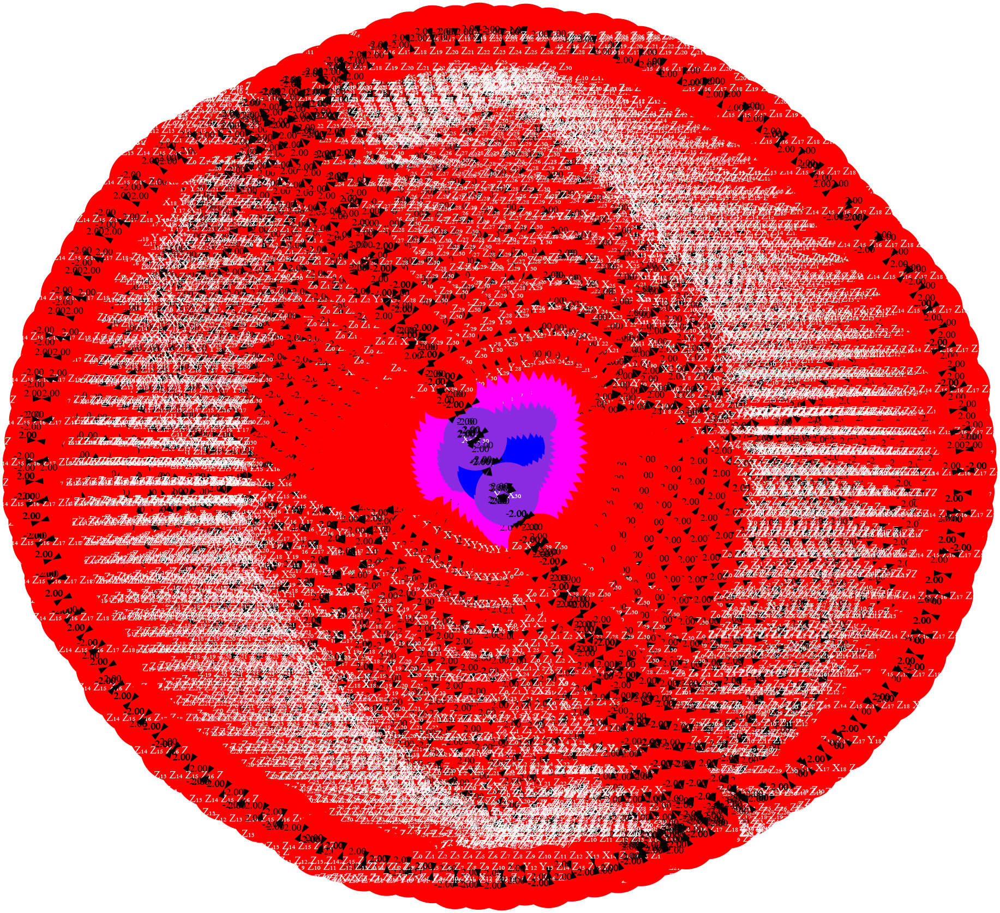

In [15]:
pad=15
padded_seed = 'I'*pad + 'Z' + 'I'*pad

dq = generate_dq_hamiltonian(len(padded_seed))
graph_dq, label_map_dq = generate_liouvillian_graph(padded_seed, dq, depth=len(padded_seed)*2, corr_cutoff=len(padded_seed), max_nodes=100000, directed=True)    

A0 = np.zeros(len(label_map_dq))
A0[0] = 1.0  # initial occupancy on root node
times = np.linspace(0.0, 5.0, 500)  
A_t = compute_time_evolution(graph_dq, A0, times)

graphviz_draw(graph_dq, node_attr_fn=node_attr, edge_attr_fn=edge_attr, method='sfdp')

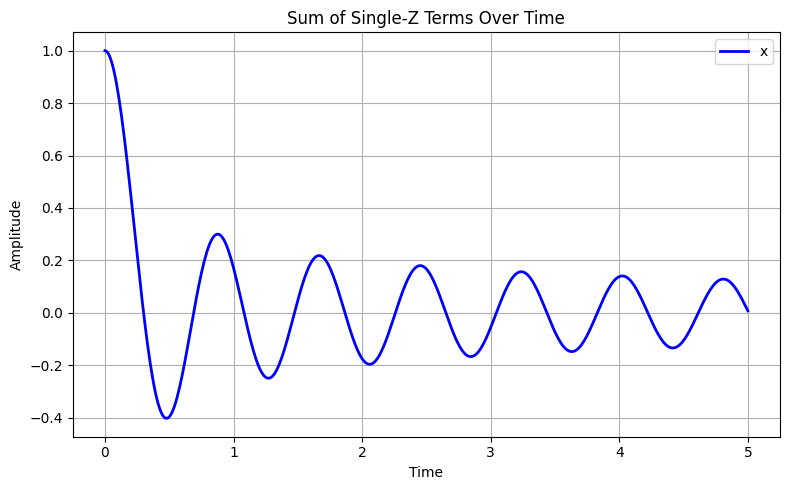

In [16]:
# Filter for labels with exactly one 'Z' and the rest 'I's
single_z_items = [(lab, idx) for lab, idx in label_map_dq.items() if set(lab) <= {"I", "Z"} and lab.count('Z') == 1]

if not single_z_items:
    print("No single-Z labels found in label_map_dq.")
else:
    # Extract indices for the relevant nodes
    idxs = [idx for _, idx in single_z_items]

    # Compute the sum of the corresponding terms in A_t
    total_single_z = np.sum(A_t[:, idxs], axis=1)

    # Plot the result
    plt.figure(figsize=(8, 5))
    plt.plot(times, total_single_z, label="x", color="blue", linewidth=2)
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.title("Sum of Single-Z Terms Over Time")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

Bessel function?

Fitted parameters: Amplitude = 0.9999999881617763, Frequency = 1.2732395467062447, Phase = -3.475827050977311e-08


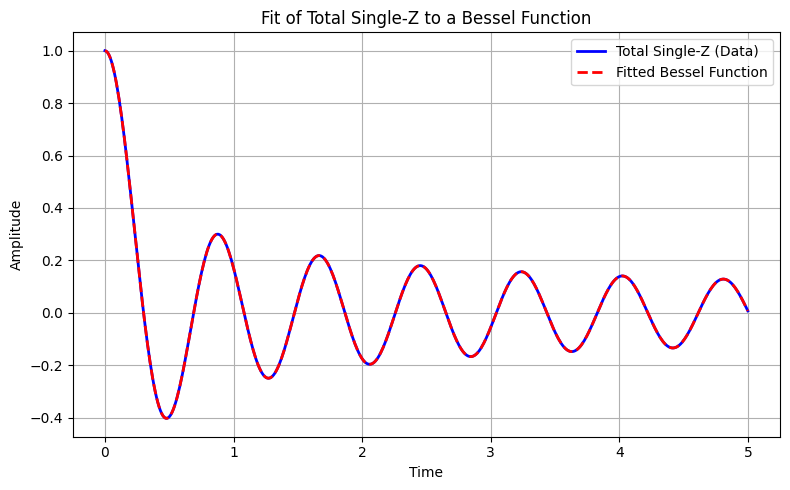

In [17]:
# Define the Bessel function model
def bessel_model(t, amplitude, frequency, phase):
    return amplitude * j0(2 * np.pi * frequency * t + phase)

# Perform the curve fitting
initial_guess = [1.0, 1.25, 0.0]  # Initial guesses for amplitude, frequency, and phase
params, covariance = curve_fit(bessel_model, times, total_single_z, p0=initial_guess)

# Extract the fitted parameters
amplitude_fit, frequency_fit, phase_fit = params
print(f"Fitted parameters: Amplitude = {amplitude_fit}, Frequency = {frequency_fit}, Phase = {phase_fit}")

# Generate the fitted curve
fitted_curve = bessel_model(times, amplitude_fit, frequency_fit, phase_fit)

# Plot the original data and the fitted curve
plt.figure(figsize=(8, 5))
plt.plot(times, total_single_z, label="Total Single-Z (Data)", color="blue", linewidth=2)
plt.plot(times, fitted_curve, label="Fitted Bessel Function", color="red", linestyle="--", linewidth=2)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.title("Fit of Total Single-Z to a Bessel Function")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

Coherence = superposition of quantum states that differ in energy that maintains a constant phase. Single quantum coherence corresponds to a superposition between two energy levels; multiple quantum coherence indicates more energy levels in our superposition

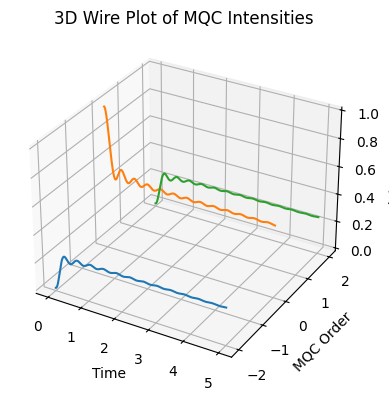

In [18]:
plot_mqc_from_label_map(label_map_dq, A_t, times)

# XXZ & Dipole Hamiltonians

The XXZ Hamiltonian with a field evolves as H = -J Σ (XX + YY + Δ ZZ) - 2h Σ Z

The dipole Hamiltonian is such that: Δ=-2, h=0, J=1/2

Layer: 0

label: IIIZIII

o_next: Operator
Sum of
(+0.0000 -1.0000j) IIYXIII
(+0.0000 +1.0000j) IIXYIII
(+0.0000 +1.0000j) IIIYXII
(+0.0000 -1.0000j) IIIXYII

Layer: 1

label: IIYXIII

o_next: Operator
Sum of
(+0.0000 -2.0000j) IZXXIII
(+0.0000 -1.0000j) IIZIIII
(+0.0000 -1.0000j) IXZXIII
(+0.0000 +1.0000j) IIIZIII
(+0.0000 +2.0000j) IIYYZII
(+0.0000 +1.0000j) IIYZYII

label: IIXYIII

o_next: Operator
Sum of
(+0.0000 +1.0000j) IIZIIII
(+0.0000 -1.0000j) IIIZIII
(+0.0000 -1.0000j) IIXZXII
(+0.0000 +1.0000j) IYZYIII
(+0.0000 +2.0000j) IZYYIII
(+0.0000 -2.0000j) IIXXZII

label: IIIYXII

o_next: Operator
Sum of
(+0.0000 -2.0000j) IIZXXII
(+0.0000 -1.0000j) IIIZIII
(+0.0000 -1.0000j) IIXZXII
(+0.0000 +1.0000j) IIIIZII
(+0.0000 +2.0000j) IIIYYZI
(+0.0000 +1.0000j) IIIYZYI

label: IIIXYII

o_next: Operator
Sum of
(+0.0000 +1.0000j) IIIZIII
(+0.0000 -1.0000j) IIIIZII
(+0.0000 -1.0000j) IIIXZXI
(+0.0000 +1.0000j) IIYZYII
(+0.0000 +2.0000j) IIZYYII
(+0.0000 -2.0000j) IIIXXZI

Layer: 2

label: IZ

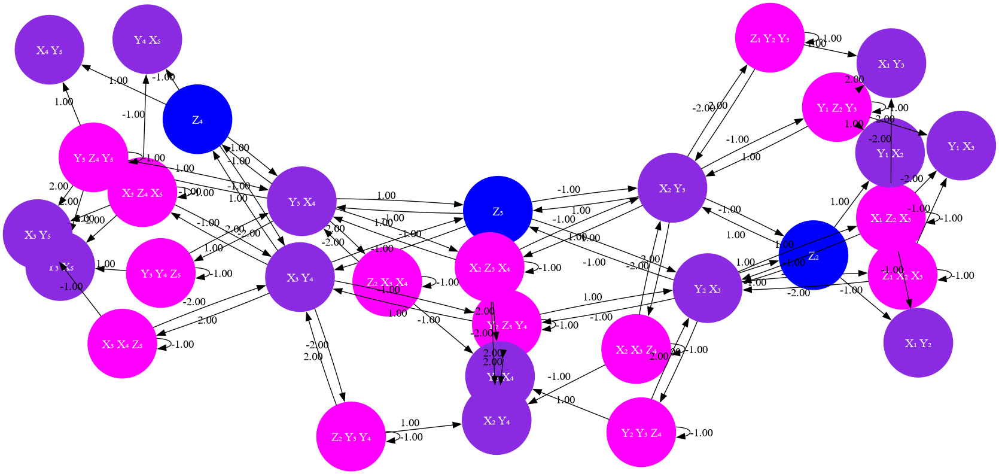

In [19]:
seed_str = 'Z'
pad_width = 3
padded_seed = 'I'*pad_width + seed_str + 'I'*pad_width
ham = generate_dipole_hamiltonian(n=len(padded_seed))
root_idx = 0  # since seed is the first node added

graph_dipole, label_map_dipole = generate_liouvillian_graph(padded_seed, ham, depth=3, corr_cutoff=3, max_nodes=100000, directed=True)
graphviz_draw(graph_dipole, node_attr_fn=node_attr, edge_attr_fn=edge_attr, method='sfdp')

We can also adjust parameters in the XXZ model to observe the effects of antiferromagnetic, paramagnetic, and ferromagnetic choices of Δ. 

Try adjusting delta below. Notice how the shape of the graph does not change, but the edge weights do.

Layer: 0

label: IIIZIII

o_next: Operator
Sum of
(+0.0000 -1.0000j) IIYXIII
(+0.0000 +1.0000j) IIXYIII
(+0.0000 +1.0000j) IIIYXII
(+0.0000 -1.0000j) IIIXYII

Layer: 1

label: IIYXIII

o_next: Operator
Sum of
(+0.0000 +1.7500j) IZXXIII
(+0.0000 -1.0000j) IIZIIII
(+0.0000 -1.0000j) IXZXIII
(+0.0000 +1.0000j) IIIZIII
(+0.0000 -1.7500j) IIYYZII
(+0.0000 +1.0000j) IIYZYII

label: IIXYIII

o_next: Operator
Sum of
(+0.0000 +1.0000j) IIZIIII
(+0.0000 -1.0000j) IIIZIII
(+0.0000 -1.0000j) IIXZXII
(+0.0000 +1.0000j) IYZYIII
(+0.0000 -1.7500j) IZYYIII
(+0.0000 +1.7500j) IIXXZII

label: IIIYXII

o_next: Operator
Sum of
(+0.0000 +1.7500j) IIZXXII
(+0.0000 -1.0000j) IIIZIII
(+0.0000 -1.0000j) IIXZXII
(+0.0000 +1.0000j) IIIIZII
(+0.0000 -1.7500j) IIIYYZI
(+0.0000 +1.0000j) IIIYZYI

label: IIIXYII

o_next: Operator
Sum of
(+0.0000 +1.0000j) IIIZIII
(+0.0000 -1.0000j) IIIIZII
(+0.0000 -1.0000j) IIIXZXI
(+0.0000 +1.0000j) IIYZYII
(+0.0000 -1.7500j) IIZYYII
(+0.0000 +1.7500j) IIIXXZI

Layer: 2

label: IZ

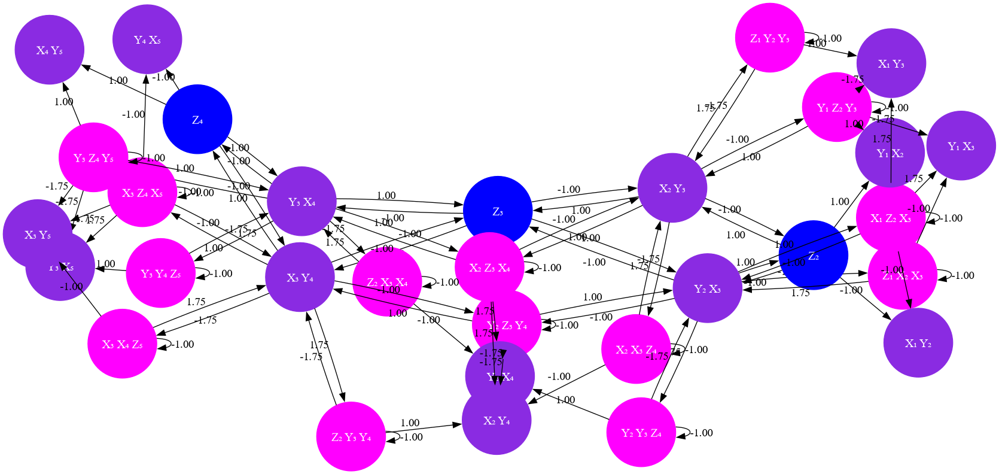

In [20]:
delta = 1.75
ham = generate_xxz_hamiltonian(n=len(padded_seed), delta=delta, h=0)
root_idx = 0  # since seed is the first node added

graph_xxz, label_map_xxz = generate_liouvillian_graph(padded_seed, ham, depth=3, corr_cutoff=3, max_nodes=100000, directed=True)
graphviz_draw(graph_xxz, node_attr_fn=node_attr, edge_attr_fn=edge_attr, method='sfdp')

Let's generate a larger XXZ hamiltonian, so we can observe the MQC spectrum

Layer: 0

label: IIIZIII

o_next: Operator
Sum of
(+0.0000 -1.0000j) IIYXIII
(+0.0000 +1.0000j) IIXYIII
(+0.0000 +1.0000j) IIIYXII
(+0.0000 -1.0000j) IIIXYII

Layer: 1

label: IIYXIII

o_next: Operator
Sum of
(+0.0000 -2.0000j) IZXXIII
(+0.0000 -1.0000j) IIZIIII
(+0.0000 -1.0000j) IXZXIII
(+0.0000 +1.0000j) IIIZIII
(+0.0000 +2.0000j) IIYYZII
(+0.0000 +1.0000j) IIYZYII

label: IIXYIII

o_next: Operator
Sum of
(+0.0000 +1.0000j) IIZIIII
(+0.0000 -1.0000j) IIIZIII
(+0.0000 -1.0000j) IIXZXII
(+0.0000 +1.0000j) IYZYIII
(+0.0000 +2.0000j) IZYYIII
(+0.0000 -2.0000j) IIXXZII

label: IIIYXII

o_next: Operator
Sum of
(+0.0000 -2.0000j) IIZXXII
(+0.0000 -1.0000j) IIIZIII
(+0.0000 -1.0000j) IIXZXII
(+0.0000 +1.0000j) IIIIZII
(+0.0000 +2.0000j) IIIYYZI
(+0.0000 +1.0000j) IIIYZYI

label: IIIXYII

o_next: Operator
Sum of
(+0.0000 +1.0000j) IIIZIII
(+0.0000 -1.0000j) IIIIZII
(+0.0000 -1.0000j) IIIXZXI
(+0.0000 +1.0000j) IIYZYII
(+0.0000 +2.0000j) IIZYYII
(+0.0000 -2.0000j) IIIXXZI

Layer: 2

label: IZ

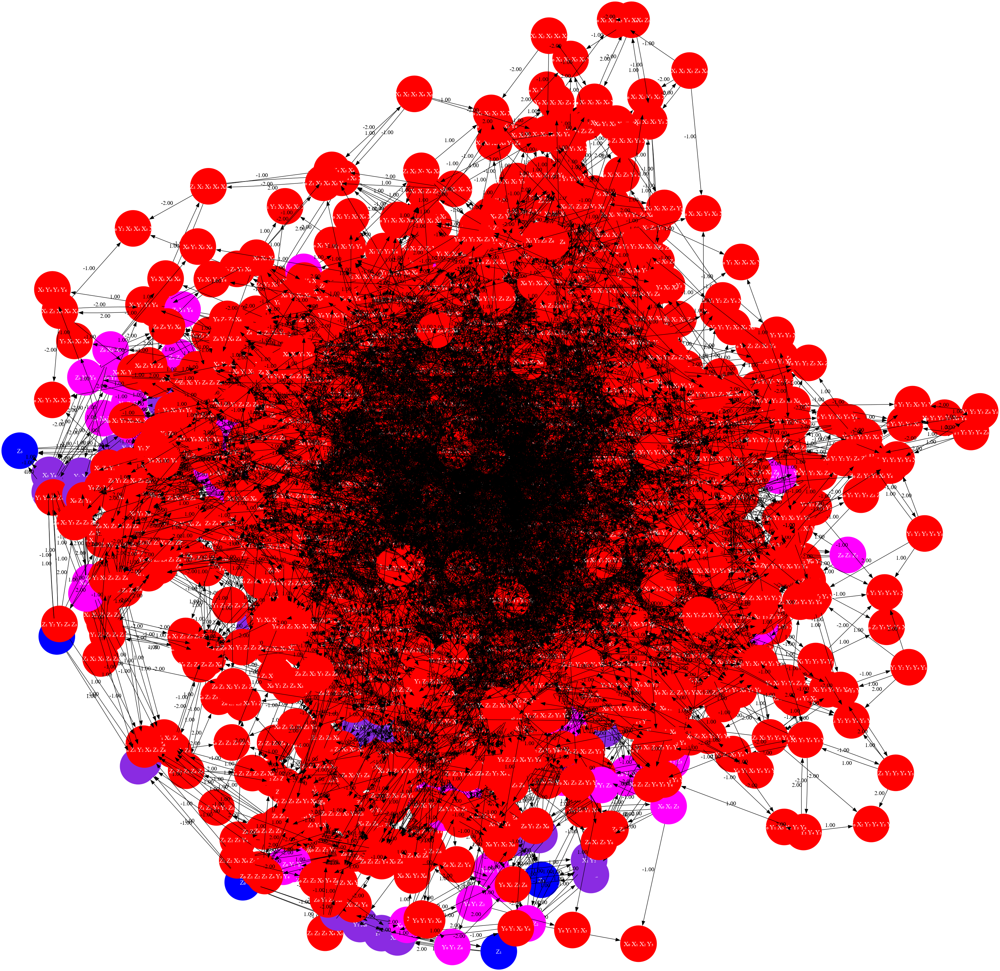

In [21]:
seed_str = 'Z'
pad_width = 3
padded_seed = 'I'*pad_width + seed_str + 'I'*pad_width
ham = generate_xxz_hamiltonian(n=len(padded_seed), delta=-2, h=0, J=1/2)
root_idx = 0  # since seed is the first node added

graph, label_map = generate_liouvillian_graph(padded_seed, ham, depth=7, corr_cutoff=7, max_nodes=100000, directed=True)
graphviz_draw(graph, node_attr_fn=node_attr, edge_attr_fn=edge_attr, method='sfdp')

In [22]:
chain_mat =  rx.adjacency_matrix(graph, weight_fn= lambda x: x).T

# Example usage with the notebook's variables:
n = chain_mat.shape[0]
A0 = np.zeros(n)
print(chain_mat)
A0[0] = 1.0     # set initial occupancy on the root node (root_idx exists in the notebook)

times = np.linspace(0.0, .75, 500)  # adjust as needed
A_t = solve_chain_time_series(chain_mat, A0, times,max_step=0.001)

# print a small summary
print("A(t) shape:", A_t.shape)
print("A(0) :", A_t[0])     # initial adjacency matrix at 0 time


[[ 0. -1.  1. ...  0.  0.  0.]
 [ 1.  0.  0. ...  0.  0.  0.]
 [-1.  0.  0. ...  0.  0.  0.]
 ...
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]]
A(t) shape: (500, 3401)
A(0) : [1. 0. 0. ... 0. 0. 0.]


Our total probability should be equal to 1. Thus, at any given time, the sum the elements of our adjacency matrix should sum to 1.

However, the Liouvillian graph is an approximation about t=0. If our graph is too small, then our approximation breaks down at large times t.  Check below the output printed remains close to 1. If it is not, you must either make the graph larger or make your times shorter.

In [23]:
for A_at_t in A_t:
    print(sum(i*i for i in A_at_t))

1.0
0.9999999999999997
1.0000000000000009
0.999999999999999
0.9999999999999992
0.9999999999999991
0.9999999999999992
0.9999999999999999
0.9999999999999974
1.0000000000000004
1.0000000000000004
0.9999999999999988
1.0000000000000007
0.9999999999999969
0.9999999999999982
1.0000000000000009
1.0000000000000004
0.9999999999999954
0.999999999999998
0.9999999999999962
0.9999999999999969
0.9999999999999937
0.9999999999999988
0.9999999999999989
0.9999999999999979
0.9999999999999952
0.9999999999999994
0.9999999999999989
0.9999999999999948
1.000000000000001
0.9999999999999942
0.9999999999999964
1.0000000000000018
0.9999999999999941
0.9999999999999925
0.9999999999999997
0.9999999999999973
1.0000000000000024
0.9999999999999976
0.9999999999999938
0.999999999999995
0.9999999999999939
0.9999999999999851
0.9999999999999862
0.9999999999999951
0.9999999999999994
0.9999999999999867
0.9999999999999887
0.9999999999999918
1.0000000000000004
0.9999999999999964
0.9999999999999953
0.9999999999999926
0.9999999999

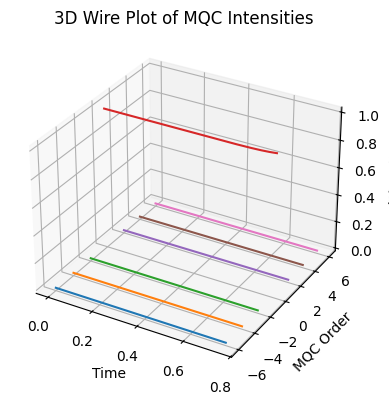

In [24]:
plot_mqc_from_label_map(label_map=label_map, A_t=A_t, times=times)

# MQC

As mentioned coherence = superposition of quantum states that differ in energy that maintains a constant phase. Single quantum coherence corresponds to a superposition between two energy levels; multiple quantum coherence indicates more energy levels in our superposition

To understand how the MQC above is calculated, let's look under the hood of plot_mqc_from_label_map.

To make this easier to visualize, let's use our DQ hamiltonian from before.

Layer: 0

label: IIIIZIIII

o_next: Operator
Sum of
(+0.0000 -2.0000j) IIIYXIIII
(+0.0000 -2.0000j) IIIXYIIII
(+0.0000 -2.0000j) IIIIYXIII
(+0.0000 -2.0000j) IIIIXYIII

Layer: 1

label: IIIYXIIII

o_next: Operator
Sum of
(+0.0000 +2.0000j) IIIZIIIII
(+0.0000 +2.0000j) IIXZXIIII
(+0.0000 +2.0000j) IIIIZIIII
(+0.0000 +2.0000j) IIIYZYIII

label: IIIXYIIII

o_next: Operator
Sum of
(+0.0000 +2.0000j) IIIZIIIII
(+0.0000 +2.0000j) IIIIZIIII
(+0.0000 +2.0000j) IIIXZXIII
(+0.0000 +2.0000j) IIYZYIIII

label: IIIIYXIII

o_next: Operator
Sum of
(+0.0000 +2.0000j) IIIIZIIII
(+0.0000 +2.0000j) IIIXZXIII
(+0.0000 +2.0000j) IIIIIZIII
(+0.0000 +2.0000j) IIIIYZYII

label: IIIIXYIII

o_next: Operator
Sum of
(+0.0000 +2.0000j) IIIIZIIII
(+0.0000 +2.0000j) IIIIIZIII
(+0.0000 +2.0000j) IIIIXZXII
(+0.0000 +2.0000j) IIIYZYIII

Layer: 2

label: IIIZIIIII

o_next: Operator
Sum of
(+0.0000 -2.0000j) IIYXIIIII
(+0.0000 -2.0000j) IIXYIIIII
(+0.0000 -2.0000j) IIIYXIIII
(+0.0000 -2.0000j) IIIXYIIII

label: IIXZXIIII

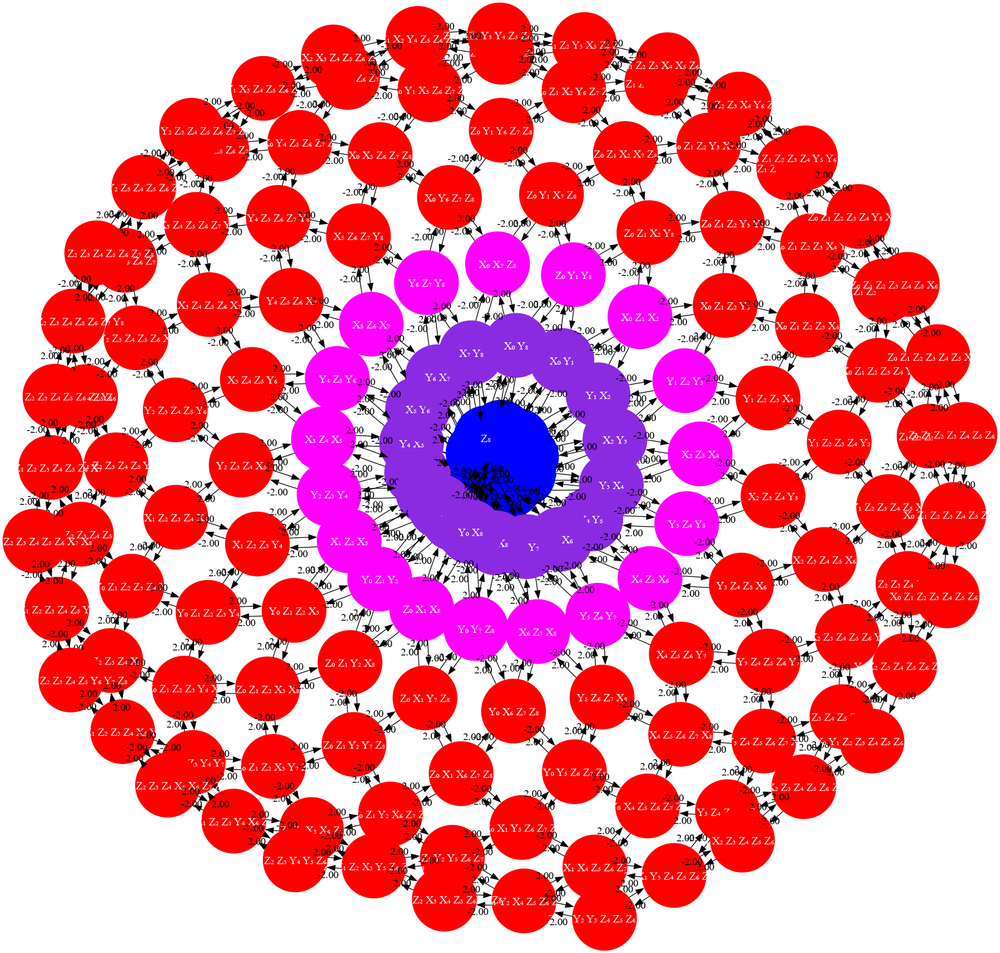

In [ ]:
pad=4
padded_seed = 'I'*pad + 'Z' + 'I'*pad

ham = generate_dq_hamiltonian(len(padded_seed))
graph, label_map = generate_liouvillian_graph(padded_seed, ham, depth=len(padded_seed)*2, corr_cutoff=len(padded_seed), max_nodes=100000, directed=True)    

A0 = np.zeros(len(label_map))
A0[0] = 1.0  # initial occupancy on root node
times = np.linspace(0.0, 2.0, 500)  
A_t = compute_time_evolution(graph, A0, times)

graphviz_draw(graph, node_attr_fn=node_attr, edge_attr_fn=edge_attr, method='sfdp')

Below, our approach is slightly more explicit than is written in plot_mqc, to show how the mqc evolves along different stages of the process.

Pauli strings are combined in "buckets," for example IZXXI, IZXYI, IZYXI, and IZYYI are in the same bucket. When we convert the pauli's to P and M, only X and Y are affected and interfere with eachother

In [41]:
from collections import defaultdict
import itertools
from itertools import product
import numpy as np

buckets = defaultdict(list)
for label, idx in label_map.items():
    key = tuple(c if c in "IZ" else '*' for c in label)
    buckets[key].append(label)

print(buckets)

defaultdict(<class 'list'>, {('I', 'I', 'I', 'I', 'Z', 'I', 'I', 'I', 'I'): ['IIIIZIIII'], ('I', 'I', 'I', '*', '*', 'I', 'I', 'I', 'I'): [np.str_('IIIYXIIII'), np.str_('IIIXYIIII')], ('I', 'I', 'I', 'I', '*', '*', 'I', 'I', 'I'): [np.str_('IIIIYXIII'), np.str_('IIIIXYIII')], ('I', 'I', 'I', 'Z', 'I', 'I', 'I', 'I', 'I'): [np.str_('IIIZIIIII')], ('I', 'I', '*', 'Z', '*', 'I', 'I', 'I', 'I'): [np.str_('IIXZXIIII'), np.str_('IIYZYIIII')], ('I', 'I', 'I', '*', 'Z', '*', 'I', 'I', 'I'): [np.str_('IIIYZYIII'), np.str_('IIIXZXIII')], ('I', 'I', 'I', 'I', 'I', 'Z', 'I', 'I', 'I'): [np.str_('IIIIIZIII')], ('I', 'I', 'I', 'I', '*', 'Z', '*', 'I', 'I'): [np.str_('IIIIYZYII'), np.str_('IIIIXZXII')], ('I', 'I', '*', '*', 'I', 'I', 'I', 'I', 'I'): [np.str_('IIYXIIIII'), np.str_('IIXYIIIII')], ('I', '*', 'Z', 'Z', '*', 'I', 'I', 'I', 'I'): [np.str_('IYZZXIIII'), np.str_('IXZZYIIII')], ('I', 'I', '*', 'Z', 'Z', '*', 'I', 'I', 'I'): [np.str_('IIXZZYIII'), np.str_('IIYZZXIII')], ('I', 'I', 'I', '*', 'Z

Let's observe how the elements of these buckets evolve over time

In [42]:
DEBUG = True

pauli = {
    'I': [(1,'I')], 'Z': [(1,'Z')],
    'X': [(1/np.sqrt(2),'P'), (1/np.sqrt(2),'M')],
    'Y': [(-1j/np.sqrt(2),'P'), (1j/np.sqrt(2),'M')]
}

# --- MQC construction ---
mqc = defaultdict(lambda: np.zeros(len(times)))

for key, labels in buckets.items():
    acc = defaultdict(lambda: np.zeros(len(times), dtype=np.complex128))

    if DEBUG:
        print(f"\n=== Bucket {key} ===")
        print("Labels:", labels)

    for label, idx in label_map.items():
        if label not in labels:
            continue

        if DEBUG:
            print(f"\nLabel {label}, idx={idx}")
            print("A_t[:, idx] (first 5):", A_t[:5, idx])
            print("A_t[:, idx] (last 5):", A_t[-5:, idx])

        for terms in product(*[pauli[c] for c in label]):
            coef, ops = 1, []
            for c,o in terms:
                coef *= c
                ops.append(o)
            ops = ''.join(ops)

            if DEBUG:
                print(f"  term {ops}, coef={coef:+g}")

            acc[ops] += coef * A_t[:, idx]

            if DEBUG:
                print("    acc[ops] (first 3):", acc[ops][:3])
                print("    acc[ops] (last 3):", acc[ops][-3:])

    if DEBUG:
        print("\n--- After summing amplitudes ---")
        for ops, amp in acc.items():
            print(f"{ops}: |amp| first 3 =", np.abs(amp[:3]))
            print(f"{ops}: |amp| last 3 =", np.abs(amp[-3:]))

    for ops, amp_t in acc.items():
        order = ops.count('P') - ops.count('M')
        mqc[order] += np.abs(amp_t)**2


    if DEBUG:
        print("\n--- MQC by order ---")
        for order, trace in sorted(mqc.items()):
            print(f"Order {order}: I(t) first 3 =", trace[:3])
            print(f"Order {order}: I(t) last 3 =", trace[-3:])

if DEBUG:
    print("\n--- MQC by order ---")
    for order, trace in sorted(mqc.items()):
        print(f"Order {order}: I(t) first 3 =", trace[:3])
        print(f"Order {order}: I(t) last 3 =", trace[-3:])

if DEBUG:
    total_I = sum(np.sum(v) for v in mqc.values())
    print("Total MQC weight:", total_I)


=== Bucket ('I', 'I', 'I', 'I', 'Z', 'I', 'I', 'I', 'I') ===
Labels: ['IIIIZIIII']

Label IIIIZIIII, idx=0
A_t[:, idx] (first 5): [1.         0.99987149 0.99948604 0.99884388 0.99794537]
A_t[:, idx] (last 5): [0.03474574 0.03340668 0.03207975 0.03076616 0.02946712]
  term IIIIZIIII, coef=+1
    acc[ops] (first 3): [1.        +0.j 0.99987149+0.j 0.99948604+0.j]
    acc[ops] (last 3): [0.03207975+0.j 0.03076616+0.j 0.02946712+0.j]

--- After summing amplitudes ---
IIIIZIIII: |amp| first 3 = [1.         0.99987149 0.99948604]
IIIIZIIII: |amp| last 3 = [0.03207975 0.03076616 0.02946712]

--- MQC by order ---
Order 0: I(t) first 3 = [1.         0.999743   0.99897235]
Order 0: I(t) last 3 = [0.00102911 0.00094656 0.00086831]

=== Bucket ('I', 'I', 'I', '*', '*', 'I', 'I', 'I', 'I') ===
Labels: [np.str_('IIIYXIIII'), np.str_('IIIXYIIII')]

Label IIIYXIIII, idx=1
A_t[:, idx] (first 5): [0.         0.00801526 0.01602588 0.02402724 0.03201471]
A_t[:, idx] (last 5): [0.04193797 0.04157924 0.0411

Finally, we can calculate the MQC, and plot!

In [43]:
for key, labels in buckets.items():
    acc = defaultdict(lambda: np.zeros(len(times), dtype=np.complex128))

    for label, idx in label_map.items():
        for terms in product(*[pauli[c] for c in label]):
            coef, ops = 1, []
            for c,o in terms:
                coef *= c
                ops.append(o)
            ops = ''.join(ops)
            acc[ops] += coef * A_t[:,idx]
            #print(acc)
    

    mqc = {}
    for ops, amp_t in acc.items():
        order = ops.count('P') - ops.count('M')
        if order not in mqc:
            mqc[order] = np.zeros(len(times))
        mqc[order] += np.abs(amp_t)**2

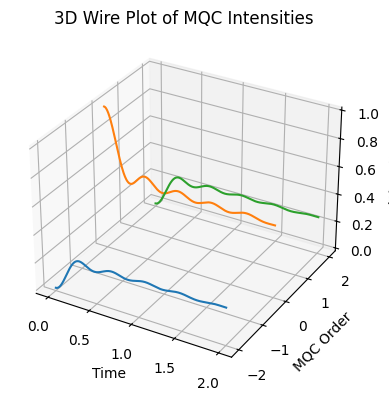

In [44]:
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111, projection='3d')

orders = sorted(mqc.keys())
Z = np.vstack([mqc[o] for o in orders])

for i, o in enumerate(orders):
    ax.plot(times, np.full_like(times, o), (Z[i]))

ax.set_xlabel("Time")
ax.set_ylabel("MQC Order")
ax.set_zlabel("Intensity")
ax.set_title("3D Wire Plot of MQC Intensities")

plt.tight_layout()
plt.show()